SME0202 Métodos Numéricos em Equações Diferenciais Ordinárias
### Trabalho 1 - Equações Elípticas - Meios Anisotrópicos e Termo de Arraste
- Cody Stefano Barham Setti - 4856322
- Ian de Holanda Cavalcante Bezerra - 13835412

# Importando Pacotes

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Preparando Constantes e Funcao para Solucao Exata

In [31]:
# Constante C
c = 4*np.pi**2 -3


# Solucao Exata do Problema

def u(x,y):
    return np.exp(-y)*np.sin(2*np.pi*x)

In [32]:

def print_matrix(matrix):  # Funcao auxiliar para printar uma matriz de forma organizada
    # Pega a largura máxima precisa para qualquer elemento
    max_width = max(len(str(element)) for row in matrix for element in row)
    
    for line in matrix:
        # Formata cada elemento para que tenha largura consistente
        formatted_row = [str(element).rjust(max_width) for element in line]
        print(" ".join(formatted_row))


# Criando Objetos POO para melhor organizacao do codigo

In [33]:

#----------// Objeto Ponto //------------------------------

class Ponto:
    def __init__(self, i, j, n):
        self.i = i
        self.j = j
        self.x = 0
        self.y = 0
        self.exact = 0
        self.ui = self.get_1d_index(i, j, n)

    def get_1d_index(self, i, j, n):   # Pega o indice unidimensional do ponto
        return (j + i * n)
    
    def __str__(self):   # Retorna o ponto formatado como (i, j)
        return f"({self.i}, {self.j})"


#----------// Objeto Mesh //------------------------------


class Mesh:
    def __init__(self, m, n):
        self.m = m
        self.n = n
        self.mesh = []
        self.create_mesh()


    def create_mesh(self):  # Cria a malha de pontos no array self.mesh
        for i in range(self.m):
            line = []
            for j in range(self.n):
                line.append(Ponto(i, j, self.n))
            self.mesh.append(line)


    def get_unkown_points(self):   # Corta os pontos do bordo da malha e cria uma nova malha
        temp = Mesh(self.m, self.n)
        for i in range(self.m):
            temp.mesh[i].remove(temp.mesh[i][0])
            temp.mesh[i].remove(temp.mesh[i][-1])
        temp.n -= 2
        temp.recalculate_ui()
        return temp


    def recalculate_ui(self):   # Recalcula o indice unidimensional ui para cada ponto
        for i in range(self.m):
            for j in range(self.n):
                self.mesh[i][j].ui = self.mesh[i][j].get_1d_index(i, j, self.n)


    def __str__(self):  # Retorna a malha formatada como (i, j)
        output = "--------------------------------------\n"
        for line in self.mesh:
            for point in line:
                output += f"{point}  "
            output += "\n"
        
        output += "--------------------------------------\n"
        output += f"{self.m} linhas e {self.n} colunas"
        return output


    def print_unkown_points(self):  # Printa a malha unidimensional ui
        print("--------------------------------------")
        print("Enumeração Unidimensional da Malha:")
        for line in self.mesh:
            for point in line:
                if (point.ui < 10):
                    print(f"(  {point.ui} )", end="  ")  
                else:
                    print(f"( {point.ui} )", end="  ")   
            print()
        print("--------------------------------------")


    def __getitem__(self, index):    # Cria de operador [] para acessar o array direto do objeto
        if index < len(self.mesh):
            return self.mesh[index]
        else:
            raise IndexError("Index out of range")


    def populate_coordinates(self, h):  # Popula cordenadas (x, y) apartir de (i, j)
        x = np.arange(0,1+h, h)    
        y = np.arange(1,-1-h, -h)  

        for line in self.mesh:
            for point in line:
                point.x = x[point.j]  
                point.y = y[point.i]  


    def exact_solution(self, h):     # Popula o campo de solucao exata no objeto ponto
        for line in self.mesh:
            for point in line:
                point.exact = np.exp(-point.y)*np.sin(2*np.pi*point.x)

# Criando Malhas: Fisica, Incognitas

In [34]:
# DISCRETIZAÇÃO DO DOMÍNIO
h = 0.05  # tamanho de passo

x = np.arange(0,1+h, h)   # discretização do eixo-x
y = np.arange(1,-1-h, -h)  # discretização do eixo-y

n = len(x)  # número de COLUNAS na malha
m = len(y)  # número de LINHAS da malha

print(f"n: {n}, m: {m}")

Malha = Mesh(m, n)
Malha.populate_coordinates(h)
Malha.exact_solution(h)
print(Malha)

"""
# Como usamos o getitem, podemos acessar os pontos da malha diretamente. 
# sem nessecidade de usar .mesh

print(Malha[0][0].y)
print(Malha[0][0].x)

"""


n: 21, m: 41
--------------------------------------
(0, 0)  (0, 1)  (0, 2)  (0, 3)  (0, 4)  (0, 5)  (0, 6)  (0, 7)  (0, 8)  (0, 9)  (0, 10)  (0, 11)  (0, 12)  (0, 13)  (0, 14)  (0, 15)  (0, 16)  (0, 17)  (0, 18)  (0, 19)  (0, 20)  
(1, 0)  (1, 1)  (1, 2)  (1, 3)  (1, 4)  (1, 5)  (1, 6)  (1, 7)  (1, 8)  (1, 9)  (1, 10)  (1, 11)  (1, 12)  (1, 13)  (1, 14)  (1, 15)  (1, 16)  (1, 17)  (1, 18)  (1, 19)  (1, 20)  
(2, 0)  (2, 1)  (2, 2)  (2, 3)  (2, 4)  (2, 5)  (2, 6)  (2, 7)  (2, 8)  (2, 9)  (2, 10)  (2, 11)  (2, 12)  (2, 13)  (2, 14)  (2, 15)  (2, 16)  (2, 17)  (2, 18)  (2, 19)  (2, 20)  
(3, 0)  (3, 1)  (3, 2)  (3, 3)  (3, 4)  (3, 5)  (3, 6)  (3, 7)  (3, 8)  (3, 9)  (3, 10)  (3, 11)  (3, 12)  (3, 13)  (3, 14)  (3, 15)  (3, 16)  (3, 17)  (3, 18)  (3, 19)  (3, 20)  
(4, 0)  (4, 1)  (4, 2)  (4, 3)  (4, 4)  (4, 5)  (4, 6)  (4, 7)  (4, 8)  (4, 9)  (4, 10)  (4, 11)  (4, 12)  (4, 13)  (4, 14)  (4, 15)  (4, 16)  (4, 17)  (4, 18)  (4, 19)  (4, 20)  
(5, 0)  (5, 1)  (5, 2)  (5, 3)  (5, 4)  (5, 5)  

'\n# Como usamos o getitem, podemos acessar os pontos da malha diretamente. \n# sem nessecidade de usar .mesh\n\nprint(Malha[0][0].y)\nprint(Malha[0][0].x)\n\n'

In [35]:
# Criando a malha de incógnitas
Us = Malha.get_unkown_points()  # Retorna a malha sem os pontos do bordo
Us.populate_coordinates(h)  # Popula as coordenadas unidimensionais ui dos pontos


# Printando a malha (i,j) e a malha unidimensional ui
print(Us)
Us.print_unkown_points()

--------------------------------------
(0, 1)  (0, 2)  (0, 3)  (0, 4)  (0, 5)  (0, 6)  (0, 7)  (0, 8)  (0, 9)  (0, 10)  (0, 11)  (0, 12)  (0, 13)  (0, 14)  (0, 15)  (0, 16)  (0, 17)  (0, 18)  (0, 19)  
(1, 1)  (1, 2)  (1, 3)  (1, 4)  (1, 5)  (1, 6)  (1, 7)  (1, 8)  (1, 9)  (1, 10)  (1, 11)  (1, 12)  (1, 13)  (1, 14)  (1, 15)  (1, 16)  (1, 17)  (1, 18)  (1, 19)  
(2, 1)  (2, 2)  (2, 3)  (2, 4)  (2, 5)  (2, 6)  (2, 7)  (2, 8)  (2, 9)  (2, 10)  (2, 11)  (2, 12)  (2, 13)  (2, 14)  (2, 15)  (2, 16)  (2, 17)  (2, 18)  (2, 19)  
(3, 1)  (3, 2)  (3, 3)  (3, 4)  (3, 5)  (3, 6)  (3, 7)  (3, 8)  (3, 9)  (3, 10)  (3, 11)  (3, 12)  (3, 13)  (3, 14)  (3, 15)  (3, 16)  (3, 17)  (3, 18)  (3, 19)  
(4, 1)  (4, 2)  (4, 3)  (4, 4)  (4, 5)  (4, 6)  (4, 7)  (4, 8)  (4, 9)  (4, 10)  (4, 11)  (4, 12)  (4, 13)  (4, 14)  (4, 15)  (4, 16)  (4, 17)  (4, 18)  (4, 19)  
(5, 1)  (5, 2)  (5, 3)  (5, 4)  (5, 5)  (5, 6)  (5, 7)  (5, 8)  (5, 9)  (5, 10)  (5, 11)  (5, 12)  (5, 13)  (5, 14)  (5, 15)  (5, 16)  (5, 17)  (5

# Montando o Sistema de Equacoes

In [43]:
# DISCRETIZAÇÃO DA EQUAÇÃO ELÍPTICA
# Função auxiliar para conversão de indexação
def get_1d_index(i, j, n):
    return (j + i * n)

n, m = Us.n, Us.m

int_points = n*m                        # número de incógnitas
print(f"Numero de incognitas: {int_points}")
A = np.zeros((int_points, int_points))  # inicialização do operador diferencial discretizado
F = np.zeros(int_points)                # inicialização do vetor de forçamento
c = 4*np.pi**2 -3                       # constante de arraste vertical



# Percorrendo os pontos (i,j) da malha (de incógnitas) para construir-se o sistema AU=F
k = 0  # índice da incógnita. Isto é: U0, U1, U2, ... , Un*m
for line_index in range(len(Us.mesh)):
    for point in Us.mesh[line_index]:
        j = point.j-1

        # Incógnitas no bordo superior da malha
        if line_index == 0:
            A[point.ui][point.ui] = 3+2*h
            A[point.ui][Us[line_index+1][j].ui] = -4
            A[point.ui][Us[line_index+2][j].ui] = 1

        # Incógnitas no bordo inferior da malha
        elif line_index == m-1:
            A[point.ui][point.ui] = -3
            A[point.ui][Us[line_index-1][j].ui] = 4
            A[point.ui][Us[line_index-2][j].ui] = -1
            
            F[point.ui] = np.exp(1)* np.sin(2*np.pi*point.x)

        # Incógnitas do interior da malha
        else:
            A[point.ui][point.ui] = -8
            A[point.ui][Us[line_index+1][j].ui] = 1
            A[point.ui][Us[line_index-1][j].ui] = 1
            if j != 0: A[point.ui][Us[line_index][j-1].ui] = 3+((c*h)/2)       # Se não está no bordo esquerdo 
            if j != Us.n-1: A[point.ui][Us[line_index][j+1].ui] = 3-((c*h)/2)  # Se não está no bordo direito
            

        k += 1

# Matriz A
print(f"Dimensão de A: {len(A)}x{len(A[0])}")
print_matrix(A)

Numero de incognitas: 779
Dimensão de A: 779x779
               3.1                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0               -4.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                1.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0                0.0  

# Tarefa 1: Obter solução numérica

In [44]:
# Solução numérica da Eq. Elíptica
U = np.linalg.solve(A,F)
print(U)   

[-4.68881700e-12 -1.26744966e-11 -2.54766333e-11 -4.51226570e-11
 -7.42474400e-11 -1.16177465e-10 -1.74972156e-10 -2.55378361e-10
 -3.62630251e-10 -5.01993831e-10 -6.77910205e-10 -8.92531822e-10
 -1.14336822e-09 -1.41965999e-09 -1.69698057e-09 -1.92942747e-09
 -2.03861353e-09 -1.89852166e-09 -1.31517018e-09 -5.98921641e-12
 -1.61890522e-11 -3.25391698e-11 -5.76266272e-11 -9.48124487e-11
 -1.48338345e-10 -2.23378674e-10 -3.25981605e-10 -4.62813281e-10
 -6.40576710e-10 -8.64919741e-10 -1.13857021e-09 -1.45833725e-09
 -1.81049282e-09 -2.16389560e-09 -2.46004215e-09 -2.59903711e-09
 -2.42028424e-09 -1.67654971e-09 -9.42153294e-12 -2.54652693e-11
 -5.11791160e-11 -9.06262721e-11 -1.49082731e-10 -2.33203239e-10
 -3.51101012e-10 -5.12253499e-10 -7.27099348e-10 -1.00612597e-09
 -1.35815733e-09 -1.78743221e-09 -2.28890751e-09 -2.84102531e-09
 -3.39494264e-09 -3.85894346e-09 -4.07644649e-09 -3.79571981e-09
 -2.62917129e-09 -1.62105575e-11 -4.38124191e-11 -8.80433909e-11
 -1.55882233e-10 -2.56385

### Tarefa 2: Obter solução analítica + cálculo dos erros

In [46]:
# Solucao analitica

Us.exact_solution(h)   # Popula o campo de solucao exata no objeto ponto


# Calculando Erro

total_error = 0
max_error = 0
num_points = 0

for line in Us.mesh:
    for point in line:
        total_error += np.abs(point.exact - U[point.ui])
        num_points += 1
        max_error = max(max_error, np.abs(point.exact - U[point.ui]))

print(f"Erro total: {total_error}")
print(f"Erro medio: {total_error / num_points}")
print(f"Erro maximo: {max_error}")



Erro total: 648.5299973556132
Erro medio: 0.8325160428185022
Erro maximo: 4.9615590997651875



# Plotando Solucao Exata e Solucao Numerica

Numerica dim: 41 linhas e 21 colunas
Exata dim: 41 linhas e 21 colunas


<Figure size 640x480 with 0 Axes>

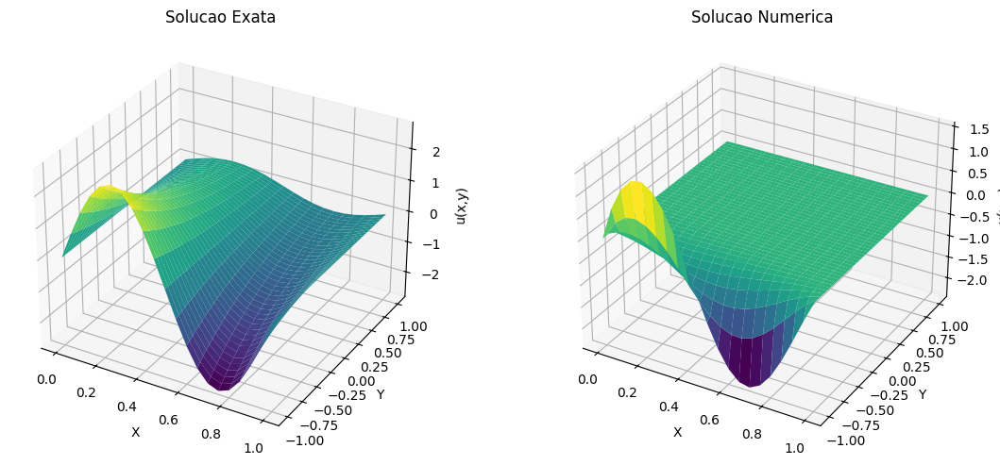

In [49]:
# Preparando Grid
X, Y = np.meshgrid(x,y)
exata = u(X,Y)


# Transformando solucao 1D em 2D
U_2d = []
for line in Us.mesh:
    row = []
    for point in line:
        row.append(U[point.ui])
    U_2d.append(row)

U_2d = np.array(U_2d)


# Adicionando Condicoes de Contorno (zeros) nas bordas
zeros_column = np.zeros((len(U_2d), 1))
U_2d = np.hstack((zeros_column, U_2d, zeros_column))

# Espelhando U_2d pela dimensao y (flip the matrix horizontally) pois a solucao exata esta definida em y decrescente 
                                                                                    # e a solucao numerica em y crescente    


U_2d = np.fliplr(U_2d)


# Checando dimensoes
print(f"Numerica dim: {len(U_2d)} linhas e {len(U_2d[0])} colunas")
print(f"Exata dim: {len(exata)} linhas e {len(exata[0])} colunas")


# Plotando Solucao Exata e Solucao Numerica
fig = plt.figure()
fig = plt.figure(figsize=(12, 5))

# Primeiro subplot para solucao exata
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(X, Y, exata, cmap='viridis')
ax1.set_title('Solucao Exata')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('u(x,y)')

# Segundo subplot para solucao numerica
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(X, Y, U_2d, cmap='viridis')
ax2.set_title('Solucao Numerica')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('u(x,y)')

plt.tight_layout()
plt.show()

### Tarefa 3: Estudo de convergência do método numérico